<a href="https://colab.research.google.com/github/saber-030/reinforcement-learning/blob/main/Multi_armed_bandits.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-Armed Bandits

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from tqdm import trange
import pandas as pd

np.random.seed(42) # For reproducibilty

# Defining the Bandit Class

In [ ]:
class Bandit:
    """
    # @k_arm: # of arms
    # @epsilon: probability for exploration in epsilon-greedy algorithm
    # @initial: initial estimation for each action
    # @step_size: constant step size for updating estimations
    # @sample_averages: if True, use sample averages to update estimations instead of constant step size
    # @UCB_param: if not None, use UCB algorithm to select action
    # @gradient: if True, use gradient based bandit algorithm
    # @gradient_baseline: if True, use average reward as baseline for gradient based bandit algorithm
    """
    def __init__(self, k_arm=10, epsilon=0., initial=0., decay=2, step_size=0.1, sample_averages=False, UCB_param=None,
                 gradient=False, gradient_baseline=False, true_reward=0., change=False, epsilon_decay=False,decay_interval=200):
        self.k = k_arm
        self.step_size = step_size
        self.sample_averages = sample_averages
        self.decay_interval = decay_interval
        self.decay = decay
        self.indices = np.arange(self.k)
        self.time = 0
        self.UCB_param = UCB_param
        self.gradient = gradient
        self.epsilon_decay = epsilon_decay
        self.gradient_baseline = gradient_baseline
        self.average_reward = 0
        self.true_reward = true_reward
        self.epsilon = epsilon
        self.initial = initial
        self.ogeps = epsilon
        self.change = change

    def reset(self):
        # real reward for each action
        self.q_true = np.random.randn(self.k) + self.true_reward

        # estimation for each action
        self.q_estimation = np.zeros(self.k) + self.initial

        # # of chosen times for each action
        self.action_count = np.zeros(self.k)

        self.best_action = np.argmax(self.q_true)

        self.time = 0

        self.epsilon = self.ogeps

    # get an action for this bandit
    def act(self):
        if self.epsilon_decay:
            if self.time%self.decay_interval == 0:
                self.epsilon /= self.decay

        if np.random.rand() < self.epsilon:
            return np.random.choice(self.indices)

        if self.UCB_param is not None:
            UCB_estimation = self.q_estimation + \
                self.UCB_param * np.sqrt(np.log(self.time + 1) / (self.action_count + 1e-5))
            q_best = np.max(UCB_estimation)
            return np.random.choice(np.where(UCB_estimation == q_best)[0])

        if self.gradient:
            exp_est = np.exp(self.q_estimation)
            self.action_prob = exp_est / np.sum(exp_est)
            return np.random.choice(self.indices, p=self.action_prob)

        q_best = np.max(self.q_estimation)
        return np.random.choice(np.where(self.q_estimation == q_best)[0])

    # take an action, update estimation for this action
    def step(self, action):
        # generate the reward under N(real reward, 1)
        reward = np.random.randn() + self.q_true[action]
        self.time += 1
        self.action_count[action] += 1
        self.average_reward += (reward - self.average_reward) / self.time

        if self.sample_averages:
            # NewEstimate = OldEstimate + StepSize[Target . OldEstimate] where stepsize = 1/k where k is the number of times the action is called.
            # update estimation using sample averages
            self.q_estimation[action] += (reward - self.q_estimation[action]) / self.action_count[action]
        elif self.gradient:
            one_hot = np.zeros(self.k)
            one_hot[action] = 1
            if self.gradient_baseline:
                baseline = self.average_reward
            else:
                baseline = 0
            self.q_estimation += self.step_size * (reward - baseline) * (one_hot - self.action_prob)
        else:
            '''
            update estimation with constant step size , useful for non stationary problems  we often encounter reinforcement learning problems that are e↵ectively nonstationary. 
            In such cases it makes sense to give more weight to recent rewards than to long-past rewards. One of the most popular ways of doing this is to use a constant step-size parameter
            '''
            self.q_estimation[action] += self.step_size * (reward - self.q_estimation[action])
        return reward

In [ ]:
def simulate(runs, time, bandits):
    rewards = np.zeros((len(bandits), runs, time))
    best_action_counts = np.zeros(rewards.shape)
    for i, bandit in enumerate(bandits):
        av_best = 0
        for r in trange(runs):
            bandit.reset()
            av_best += bandit.q_true[bandit.best_action]
            for t in range(time):
                action = bandit.act()
                reward = bandit.step(action)
                rewards[i, r, t] = reward
                if action == bandit.best_action:
                    best_action_counts[i, r, t] = 1
                if bandit.change == True:
                    if t == time/2:
                        bandit.q_true = np.random.randn(bandit.k) + bandit.true_reward
    mean_best_action_counts = best_action_counts.mean(axis=1)
    mean_rewards = rewards.mean(axis=1)
    return mean_best_action_counts, mean_rewards, av_best

# Reward Distribution

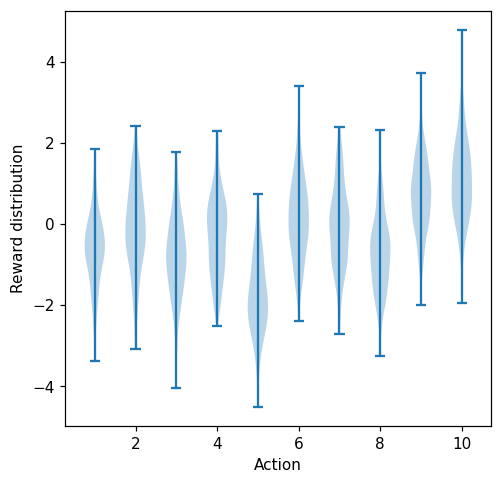

In [ ]:
plt.figure(figsize=(5, 5), dpi= 110, facecolor='w', edgecolor='k')
plt.violinplot(dataset=np.random.randn(200, 10) + np.random.randn(10))
plt.xlabel("Action")
plt.ylabel("Reward distribution")
plt.show()

# Hyperparameters

In [ ]:
# Hyperparameters
runs = 2000
time = 1000

# Greedy Agent

100%|██████████████████████████████████████| 2000/2000 [00:18<00:00, 107.74it/s]


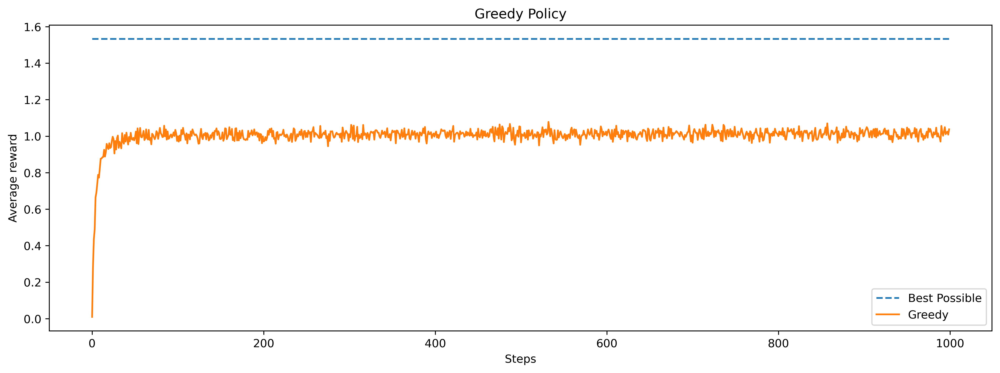

In [ ]:
# Greedy Policy
bandits = []
bandits.append(Bandit(epsilon=0, sample_averages=True))
_, average_rewards, av_best = simulate(runs, time, bandits)

plt.figure(figsize=(15, 5), dpi= 440, facecolor='w', edgecolor='k')
plt.plot([av_best / runs for _ in range(time)], linestyle="--")
plt.plot(average_rewards[0], label='Greedy')
plt.title("Greedy Policy")
plt.xlabel('Steps')
plt.ylabel('Average reward')
plt.legend(["Best Possible", "Greedy"])
plt.show() 

# Epsilon-Greedy Agent

100%|██████████████████████████████████████| 2000/2000 [00:17<00:00, 114.16it/s]


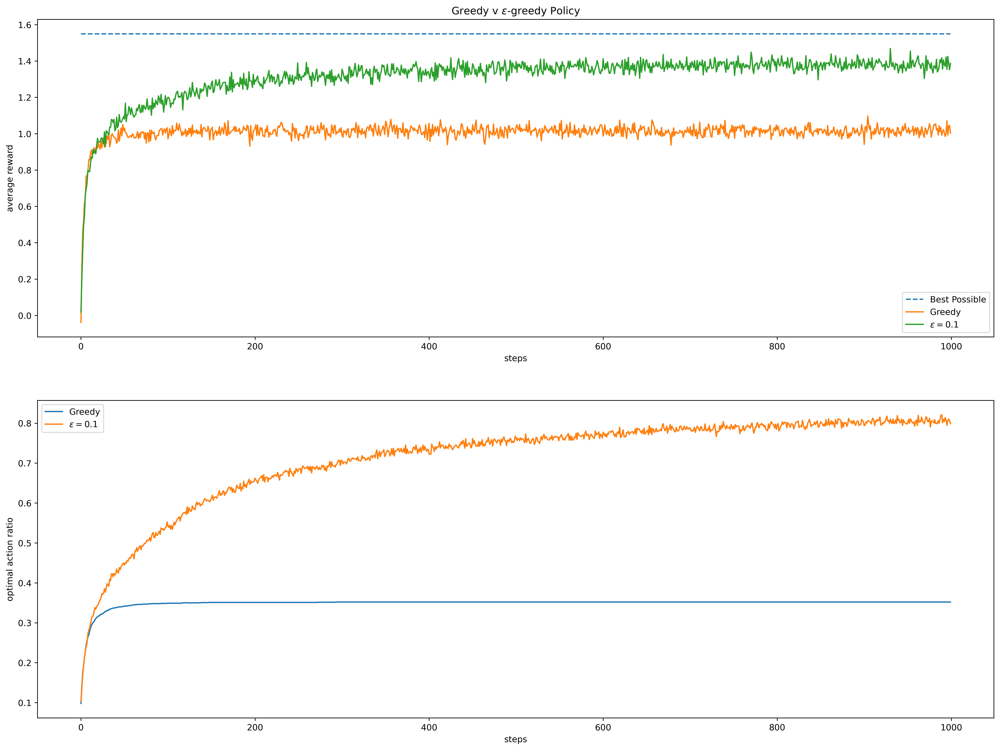

In [ ]:
# Greedy v Epsilon-Greedy
epsilons = [0, 0.1]
bandits = [Bandit(epsilon=eps, sample_averages=True) for eps in epsilons]
best_action_counts, rewards, av_best = simulate(runs, time, bandits)

plt.figure(figsize=(20, 15), dpi= 440, facecolor='w', edgecolor='k')

plt.subplot(2, 1, 1)
plt.plot([av_best / runs for _ in range(time)], linestyle="--")
for eps, rewards in zip(epsilons, rewards):
    plt.plot(rewards, label='$\epsilon = %.02f$' % (eps))
plt.title("Greedy v $\epsilon$-greedy Policy")
plt.xlabel('steps')
plt.ylabel('average reward')
plt.legend(["Best Possible", "Greedy", r'$\epsilon=0.1$'])

plt.subplot(2, 1, 2)
for eps, counts in zip(epsilons, best_action_counts):
    plt.plot(counts, label='$\epsilon = %.02f$' % (eps))
plt.xlabel('steps')
plt.ylabel('optimal action ratio')
plt.legend(["Greedy", r'$\epsilon=0.1$'])
plt.show()

# Comparison of Epsilon values

100%|██████████████████████████████████████| 2000/2000 [00:14<00:00, 133.44it/s]


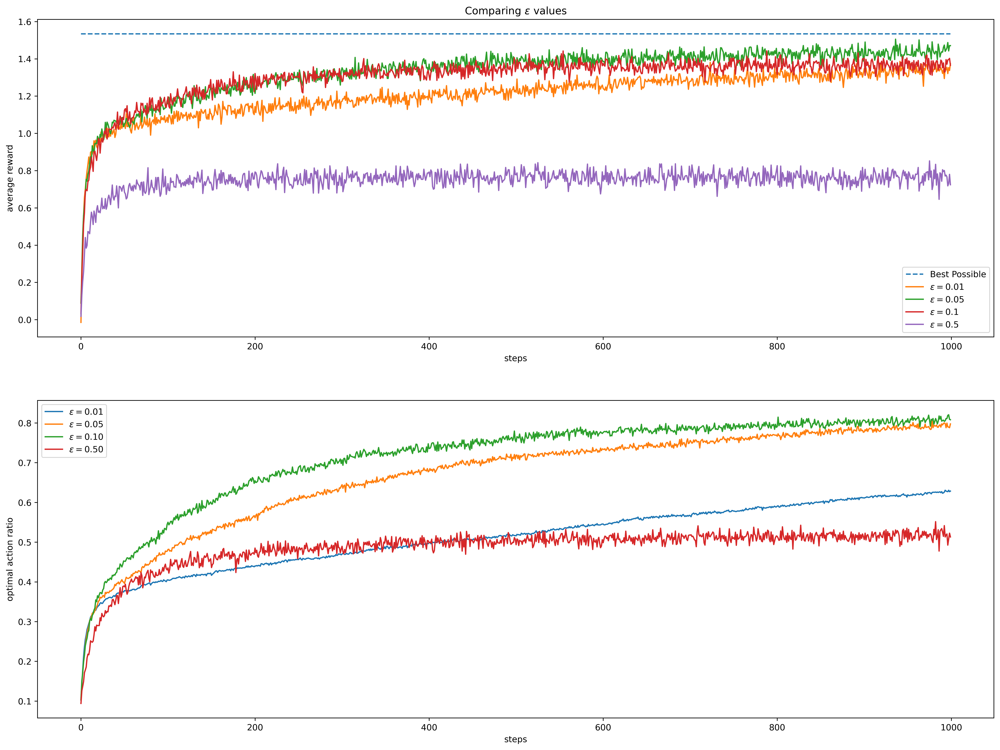

In [ ]:
# Comparing various epsilon values
epsilons = [0.01, 0.05, 0.1, 0.5]
bandits = [Bandit(epsilon=eps, sample_averages=True) for eps in epsilons]
best_action_counts, rewards, av_best = simulate(runs, time, bandits)

plt.figure(figsize=(20, 15), dpi= 440, facecolor='w', edgecolor='k')

plt.subplot(2, 1, 1)
plt.plot([av_best / runs for _ in range(time)], linestyle="--")
for eps, rewards in zip(epsilons, rewards):
    plt.plot(rewards, label='$\epsilon = %.02f$' % (eps))
plt.title("Comparing $\epsilon$ values")
plt.xlabel('steps')
plt.ylabel('average reward')
plt.legend(["Best Possible", r'$\epsilon=0.01$', r'$\epsilon=0.05$', r'$\epsilon=0.1$', r'$\epsilon=0.5$'])

plt.subplot(2, 1, 2)
for eps, counts in zip(epsilons, best_action_counts):
    plt.plot(counts, label='$\epsilon = %.02f$' % (eps))
plt.xlabel('steps')
plt.ylabel('optimal action ratio')
plt.legend()
plt.show()

# Comparison of Step-sizes

100%|██████████████████████████████████████| 2000/2000 [00:18<00:00, 110.01it/s]


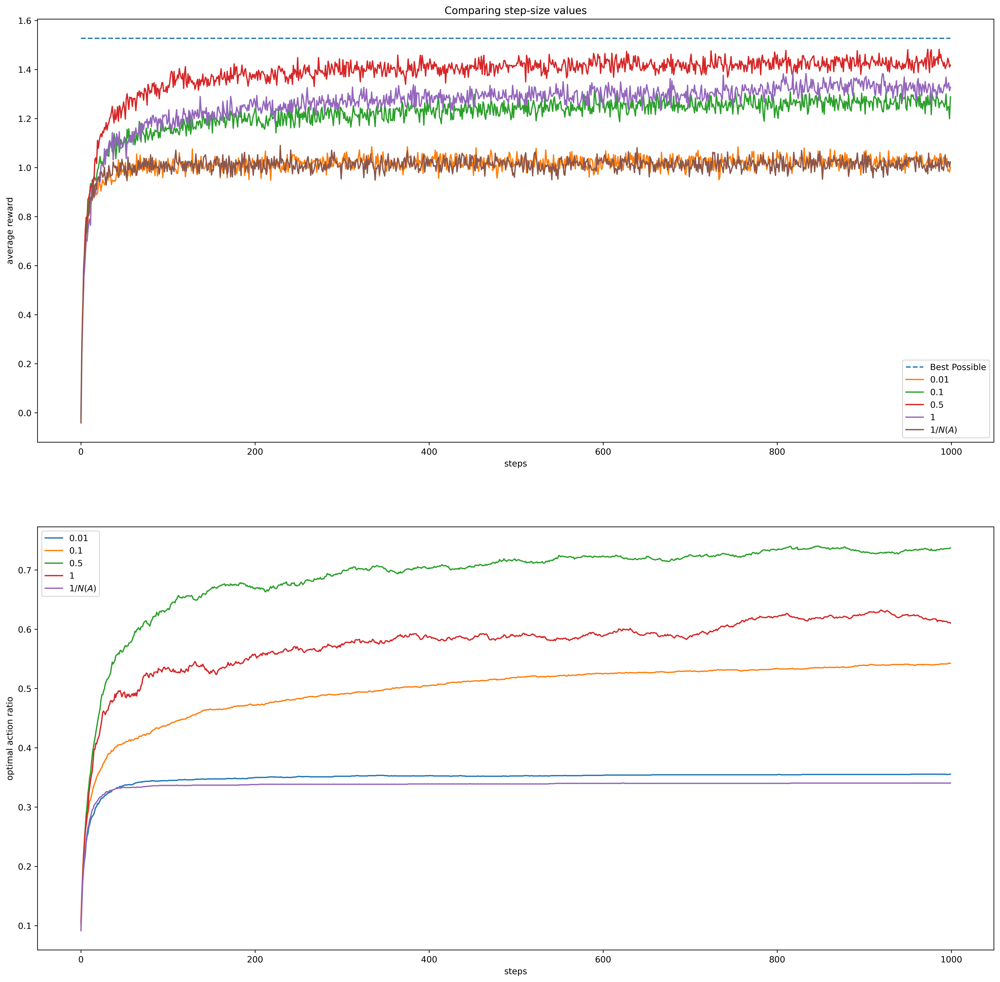

In [ ]:
# Comparing various step-size values
sizes = [0.01, 0.1, 0.5, 1, "1/N(A)"]
bandits = []
for size in sizes:
    if size == "1/N(A)":
        bandits.append(Bandit(sample_averages=True))
    else:
        bandits.append(Bandit(step_size=size, sample_averages=False))
best_action_counts, rewards, av_best = simulate(runs, time, bandits)

plt.figure(figsize=(20, 20), dpi= 440, facecolor='w', edgecolor='k')

plt.subplot(2, 1, 1)
plt.plot([av_best / runs for _ in range(time)], linestyle="--")
for eps, rewards in zip(sizes, rewards):
    plt.plot(rewards)
plt.title("Comparing step-size values")
plt.xlabel('steps')
plt.ylabel('average reward')
plt.legend(["Best Possible", r'$0.01$', r'$0.1$', r'$0.5$', r'$1$', r'$1/N(A)$'])

plt.subplot(2, 1, 2)
for eps, counts in zip(sizes, best_action_counts):
    plt.plot(counts)
plt.xlabel('steps')
plt.ylabel('optimal action ratio')
plt.legend([r'$0.01$', r'$0.1$', r'$0.5$', r'$1$', r'$1/N(A)$'])
plt.show()

# Optimistic Initial Values

100%|██████████████████████████████████████| 2000/2000 [00:18<00:00, 111.02it/s]


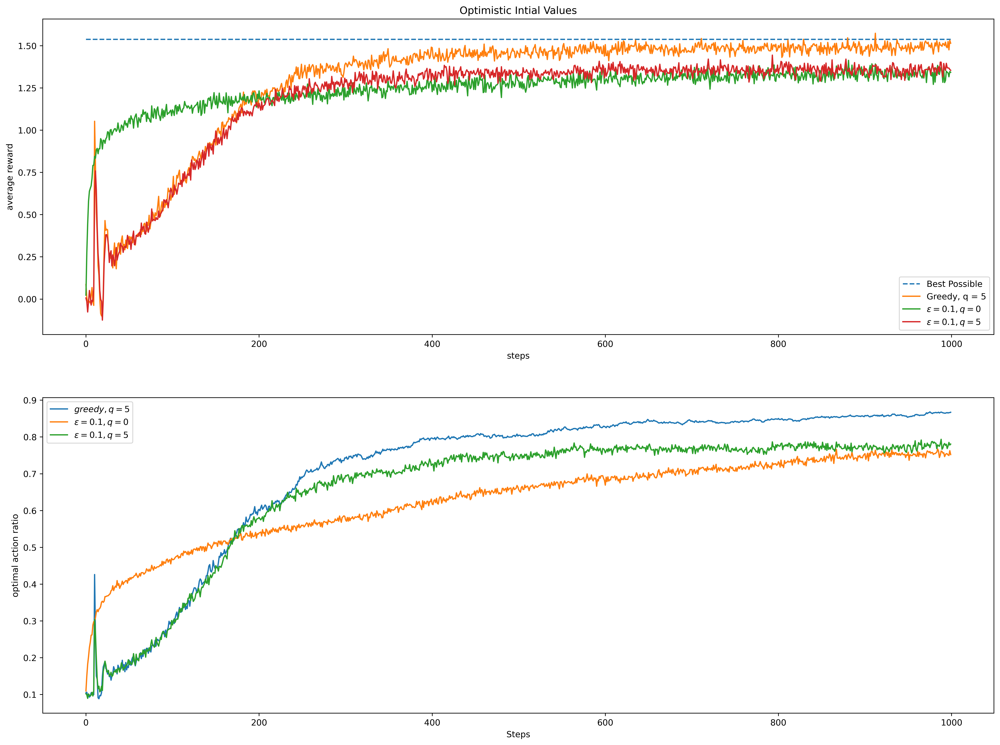

In [ ]:
# Optimmistic Initial Values
bandits = []
bandits.append(Bandit(epsilon=0, initial=5, step_size=0.1))
bandits.append(Bandit(epsilon=0.1, initial=0, step_size=0.1))
bandits.append(Bandit(epsilon=0.1, initial=5, step_size=0.1))
best_action_counts, rewards, av_best = simulate(runs, time, bandits)

plt.figure(figsize=(20, 15), dpi= 440, facecolor='w', edgecolor='k')

plt.subplot(2, 1, 1)
plt.plot([av_best / runs for _ in range(time)], linestyle="--")
for eps, rewards in zip(bandits, rewards):
    plt.plot(rewards)
plt.title("Optimistic Intial Values")
plt.xlabel('steps')
plt.ylabel('average reward')
plt.legend(["Best Possible", r'Greedy, q = 5', r'$\epsilon=0.1, q = 0$', r'$\epsilon=0.1, q = 5$'])

plt.subplot(2, 1, 2)
plt.plot(best_action_counts[0], label='$greedy, q = 5$')
plt.plot(best_action_counts[1], label='$\epsilon = 0.1, q = 0$')
plt.plot(best_action_counts[2], label='$\epsilon = 0.1, q = 5$')
plt.xlabel('Steps')
plt.ylabel('optimal action ratio')
plt.legend()
plt.show()

# Upper-Confidence Bound Selection

100%|██████████████████████████████████████| 2000/2000 [00:17<00:00, 112.83it/s]


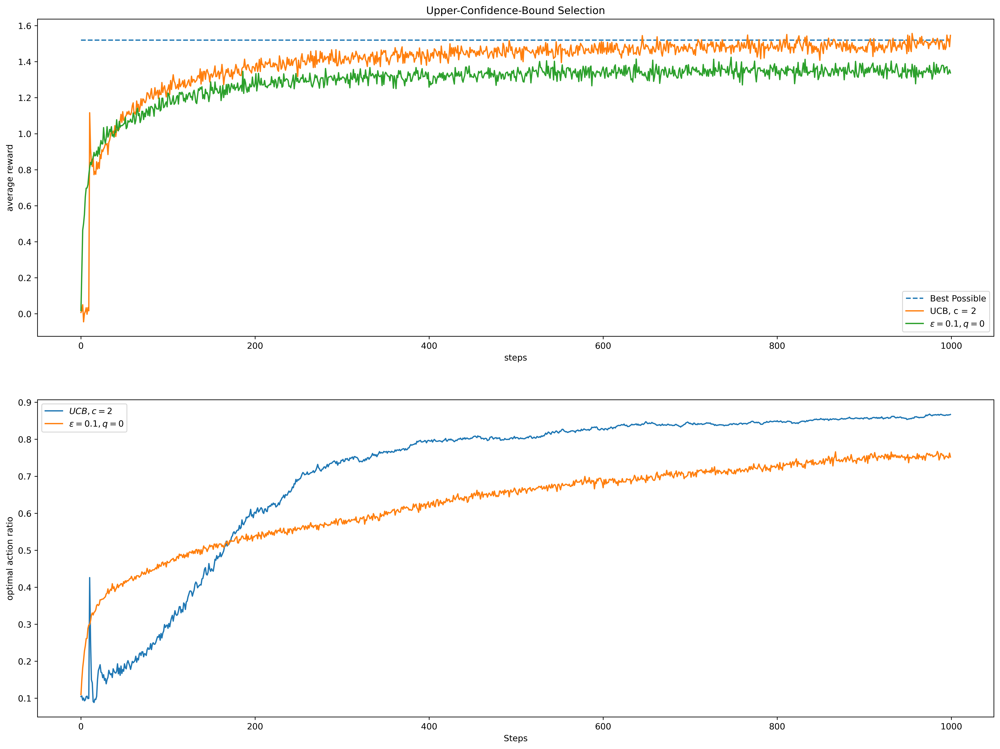

In [ ]:
# UCB Selection
bandits = []
bandits.append(Bandit(epsilon=0, UCB_param=2, sample_averages=True))
bandits.append(Bandit(epsilon=0.1, sample_averages=True))
_, average_rewards, av_best = simulate(runs, time, bandits)

plt.figure(figsize=(20, 15), dpi= 440, facecolor='w', edgecolor='k')

plt.subplot(2, 1, 1)
plt.plot([av_best / runs for _ in range(time)], linestyle="--")
plt.plot(average_rewards[0], label='UCB $c = 2$')
plt.plot(average_rewards[1], label='epsilon greedy $\epsilon = 0.1$')
plt.title("Upper-Confidence-Bound Selection")
plt.xlabel('steps')
plt.ylabel('average reward')
plt.legend(["Best Possible", r'UCB, c = 2', r'$\epsilon=0.1, q = 0$', r'$greedy, q = 5$'])

plt.subplot(2, 1, 2)
plt.plot(best_action_counts[0], label='$UCB, c = 2$')
plt.plot(best_action_counts[1], label='$\epsilon=0.1, q = 0$')
plt.xlabel('Steps')
plt.ylabel('optimal action ratio')
plt.legend()
plt.show()

# Gradient bandits

100%|███████████████████████████████████████| 2000/2000 [00:30<00:00, 66.19it/s]


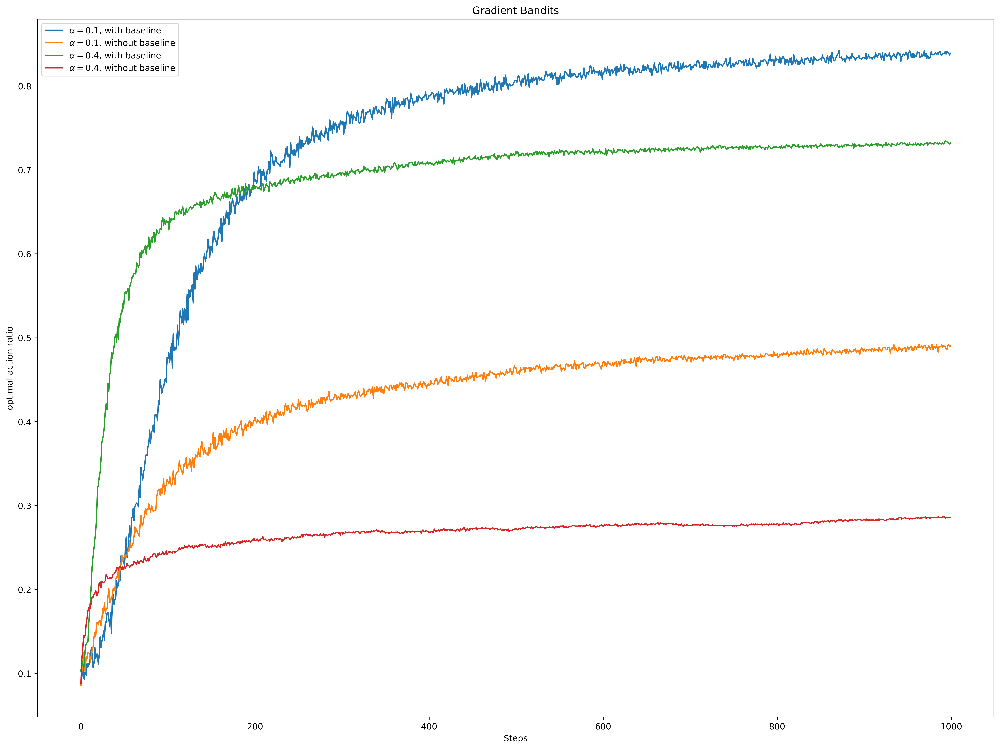

In [ ]:
# Gradient Bandits
bandits = []
bandits.append(Bandit(gradient=True, step_size=0.1, gradient_baseline=True, true_reward=4))
bandits.append(Bandit(gradient=True, step_size=0.1, gradient_baseline=False, true_reward=4))
bandits.append(Bandit(gradient=True, step_size=0.4, gradient_baseline=True, true_reward=4))
bandits.append(Bandit(gradient=True, step_size=0.4, gradient_baseline=False, true_reward=4))
best_action_counts, _, _ = simulate(runs, time, bandits)
labels = [r'$\alpha = 0.1$, with baseline',
          r'$\alpha = 0.1$, without baseline',
          r'$\alpha = 0.4$, with baseline',
          r'$\alpha = 0.4$, without baseline']

plt.figure(figsize=(20, 15), dpi= 440, facecolor='w', edgecolor='k')
for i in range(len(bandits)):
    plt.plot(best_action_counts[i], label=labels[i])
plt.title("Gradient Bandits")
plt.xlabel('Steps')
plt.ylabel('optimal action ratio')
plt.legend()
plt.show()

# Parametric Analysis

100%|██████████████████████████████████████| 2000/2000 [00:18<00:00, 110.15it/s]


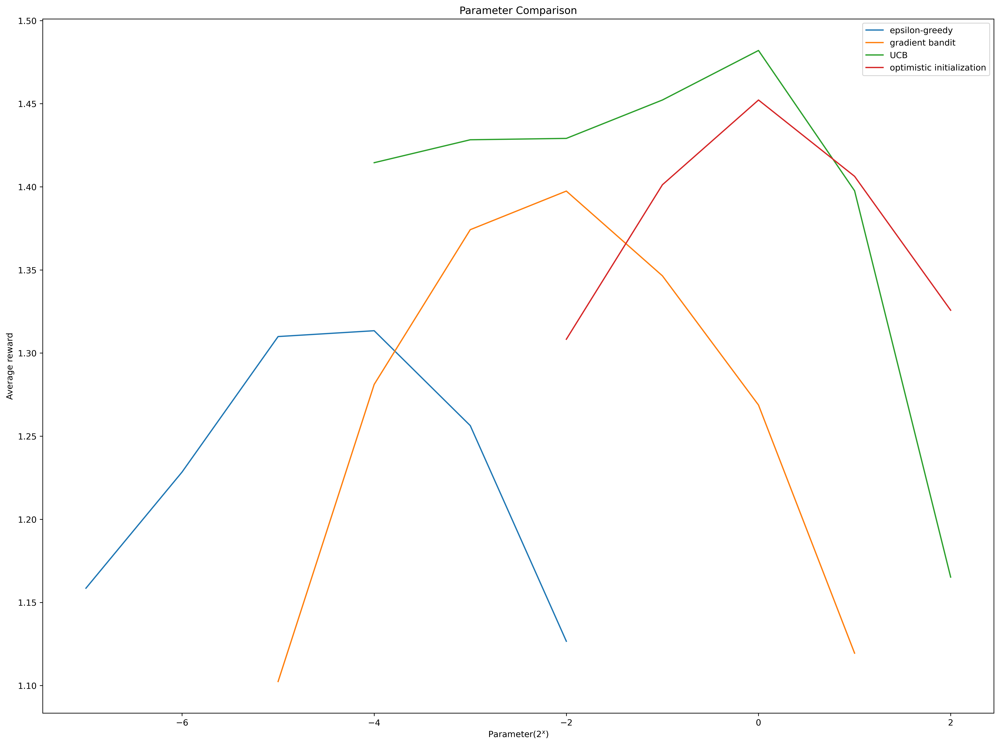

In [ ]:
labels = ['epsilon-greedy', 'gradient bandit',
              'UCB', 'optimistic initialization']
generators = [lambda epsilon: Bandit(epsilon=epsilon, sample_averages=True),
              lambda alpha: Bandit(gradient=True, step_size=alpha, gradient_baseline=True),
              lambda coef: Bandit(epsilon=0, UCB_param=coef, sample_averages=True),
              lambda initial: Bandit(epsilon=0, initial=initial, step_size=0.1)]
parameters = [np.arange(-7, -1, dtype=np.float64),
              np.arange(-5, 2, dtype=np.float64),
              np.arange(-4, 3, dtype=np.float64),
              np.arange(-2, 3, dtype=np.float64)]

bandits = []
for generator, parameter in zip(generators, parameters):
    for param in parameter:
        bandits.append(generator(pow(2, param)))

_, average_rewards, _ = simulate(runs, time, bandits)
rewards = np.mean(average_rewards, axis=1)

plt.figure(figsize=(20, 15), dpi= 440, facecolor='w', edgecolor='k')
i = 0
for label, parameter in zip(labels, parameters):
    l = len(parameter)
    plt.plot(parameter, rewards[i:i+l], label=label)
    i += l
plt.title("Parameter Comparison")
plt.xlabel('Parameter($2^x$)')
plt.ylabel('Average reward')
plt.legend()
plt.show()

# Non-stationary Enviornment

In [ ]:
# Comparing various step-size values
bandits = []
bandits.append(Bandit(epsilon=0.01, sample_averages=True, change=True))
bandits.append(Bandit(epsilon=0.01, step_size=0.1, sample_averages=False, change=True))
bandits.append(Bandit(epsilon=0.5, sample_averages=False, epsilon_decay=True, initial=5,step_size=0.1,change=True))
bandits.append(Bandit(epsilon=0.5, sample_averages=False, epsilon_decay=True, initial=5,step_size=0.1,change=True,UCB_param=2))
bandits.append(Bandit(epsilon=0.01, sample_averages=False, epsilon_decay=False, initial=5,step_size=0.1,change=True,gradient=True,gradient_baseline=False))
bandits.append(Bandit(epsilon=0.01, sample_averages=False, epsilon_decay=False, initial=5,step_size=0.1,change=True,gradient=True,gradient_baseline=True))
bandits.append(Bandit(epsilon=0.5, sample_averages=False, epsilon_decay=True, initial=5,step_size=0.1,change=True,gradient=True,gradient_baseline=True))
_, average_rewards, av_best = simulate(runs, time, bandits)

plt.figure(figsize=(20, 8), dpi= 440, facecolor='w', edgecolor='k')

100%|██████████| 2000/2000 [03:45<00:00,  8.88it/s]


<Figure size 8800x3520 with 0 Axes>

<Figure size 8800x3520 with 0 Axes>

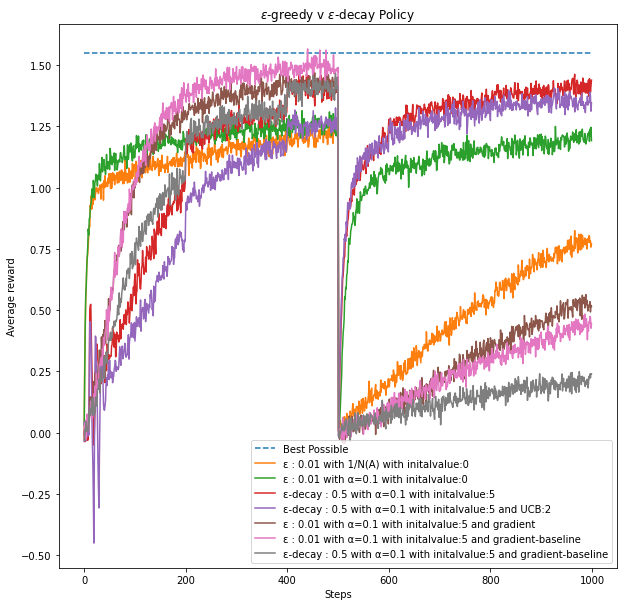

In [ ]:
plt.figure(figsize=(10, 10), facecolor='w', edgecolor='k')
plt.plot([av_best / runs for _ in range(time)], linestyle="--",label='Best Possible')
plt.plot(average_rewards[0], label='ε : 0.01 with 1/N(A) with initalvalue:0')
plt.plot(average_rewards[1], label='ε : 0.01 with α=0.1 with initalvalue:0')
plt.plot(average_rewards[2], label='ε-decay : 0.5 with α=0.1 with initalvalue:5')
plt.plot(average_rewards[3], label='ε-decay : 0.5 with α=0.1 with initalvalue:5 and UCB:2')
plt.plot(average_rewards[4], label='ε : 0.01 with α=0.1 with initalvalue:5 and gradient')
plt.plot(average_rewards[5], label='ε : 0.01 with α=0.1 with initalvalue:5 and gradient-baseline')
plt.plot(average_rewards[6], label='ε-decay : 0.5 with α=0.1 with initalvalue:5 and gradient-baseline')
plt.title("Non-Stationary Environment")
plt.xlabel('Steps')
plt.ylabel('Average reward')
plt.legend()
plt.show() 

# Epsilon Methods

## Greedy, epsilon and decay

In [ ]:
# Hyperparameters
runs = 2000
time = 1000

In [ ]:
# Epsilon decay Policy
bandits = []
bandits.append(Bandit(epsilon=0, sample_averages=True))
bandits.append(Bandit(epsilon=0.01, sample_averages=True))
bandits.append(Bandit(epsilon=0.1, sample_averages=True))
bandits.append(Bandit(epsilon=0.5, sample_averages=True))
bandits.append(Bandit(epsilon=0.1, sample_averages=True, epsilon_decay=True))
bandits.append(Bandit(epsilon=0.5, sample_averages=True, epsilon_decay=True))
_, average_rewards, av_best = simulate(runs, time, bandits)



100%|██████████| 2000/2000 [01:38<00:00, 20.40it/s]


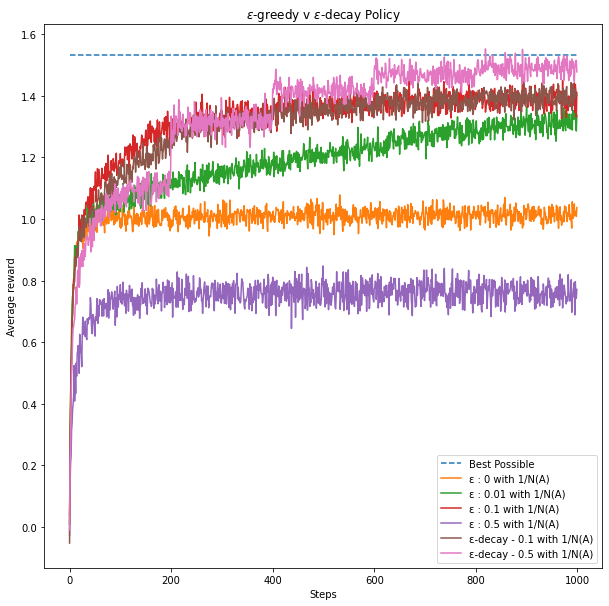

In [ ]:
plt.figure(figsize=(10, 10), facecolor='w', edgecolor='k')
plt.plot([av_best / runs for _ in range(time)], linestyle="--",label='Best Possible')
plt.plot(average_rewards[0], label='ε : 0 with 1/N(A)')
plt.plot(average_rewards[1], label='ε : 0.01 with 1/N(A)')
plt.plot(average_rewards[2], label='ε : 0.1 with 1/N(A)')
plt.plot(average_rewards[3], label='ε : 0.5 with 1/N(A)')
plt.plot(average_rewards[4], label='ε-decay - 0.1 with 1/N(A)')
plt.plot(average_rewards[5], label='ε-decay - 0.5 with 1/N(A)')
plt.title("$\epsilon$-greedy v $\epsilon$-decay Policy with 1/N(A)")
plt.xlabel('Steps')
plt.ylabel('Average reward')
plt.legend()
plt.show() 

## Greedy, epsilon and decay with optimistic inital values

In [ ]:
# Hyperparameters
runs = 2000
time = 1000

In [ ]:
# Epsilon decay Policy
bandits = []
bandits.append(Bandit(epsilon=0, sample_averages=True, initial=5))
bandits.append(Bandit(epsilon=0.01, sample_averages=True,initial=5))
bandits.append(Bandit(epsilon=0.1, sample_averages=True,initial=5))
bandits.append(Bandit(epsilon=0.5, sample_averages=True, initial=5))
bandits.append(Bandit(epsilon=0.1, sample_averages=True, epsilon_decay=True,initial=5))
bandits.append(Bandit(epsilon=0.5, sample_averages=True, epsilon_decay=True))
bandits.append(Bandit(epsilon=0.5, sample_averages=True, epsilon_decay=True, initial=5))
_, average_rewards, av_best = simulate(runs, time, bandits)

100%|██████████| 2000/2000 [01:44<00:00, 19.14it/s]


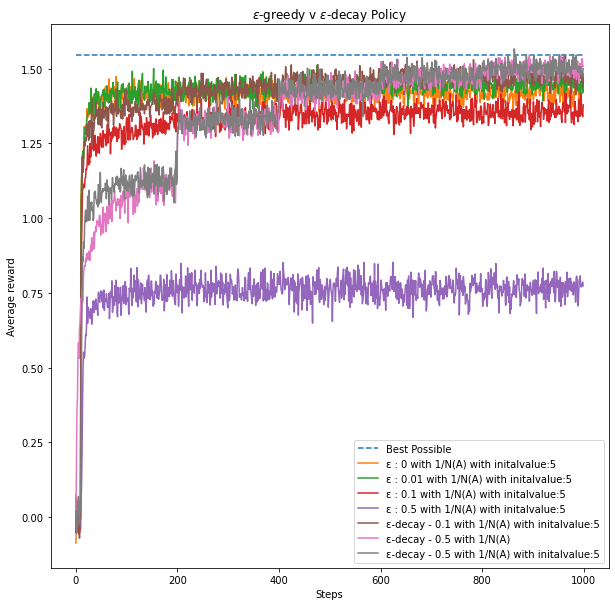

In [ ]:
plt.figure(figsize=(10, 10), facecolor='w', edgecolor='k')
plt.plot([av_best / runs for _ in range(time)], linestyle="--",label='Best Possible')
plt.plot(average_rewards[0], label='ε : 0 with 1/N(A) with initalvalue:5')
plt.plot(average_rewards[1], label='ε : 0.01 with 1/N(A) with initalvalue:5')
plt.plot(average_rewards[2], label='ε : 0.1 with 1/N(A) with initalvalue:5')
plt.plot(average_rewards[3], label='ε : 0.5 with 1/N(A) with initalvalue:5')
plt.plot(average_rewards[4], label='ε-decay - 0.1 with 1/N(A) with inital value:5')
plt.plot(average_rewards[5], label='ε-decay - 0.5 with 1/N(A)')
plt.plot(average_rewards[6], label='ε-decay - 0.5 with 1/N(A) with inital value:5')
plt.title("$\epsilon$-greedy v $\epsilon$-decay Policy with Optimistic Initialization")
plt.xlabel('Steps')
plt.ylabel('Average reward')
plt.legend()
plt.show() 

# Step size

In [ ]:
# Hyperparameters
runs = 2000
time = 1000

In [ ]:
# Epsilon decay Policy
bandits = []
bandits.append(Bandit(epsilon=0.01, sample_averages=False , step_size=0.1))
bandits.append(Bandit(epsilon=0.01, sample_averages=False,initial=5, step_size=0.1))
bandits.append(Bandit(epsilon=0.01, sample_averages=False,initial=5 , step_size=0.4))
bandits.append(Bandit(epsilon=0.01, sample_averages=False, initial=5, step_size=0.6))
bandits.append(Bandit(epsilon=0.01, sample_averages=False, initial=5, step_size=0.8))
bandits.append(Bandit(epsilon=0.01, sample_averages=False, initial=5, step_size=1))
bandits.append(Bandit(epsilon=0.5, sample_averages=True, epsilon_decay=True, initial=5))
bandits.append(Bandit(epsilon=0.5, sample_averages=False, epsilon_decay=True, initial=5,step_size=0.1))
_, average_rewards, av_best = simulate(runs, time, bandits)

100%|██████████| 2000/2000 [01:49<00:00, 18.29it/s]


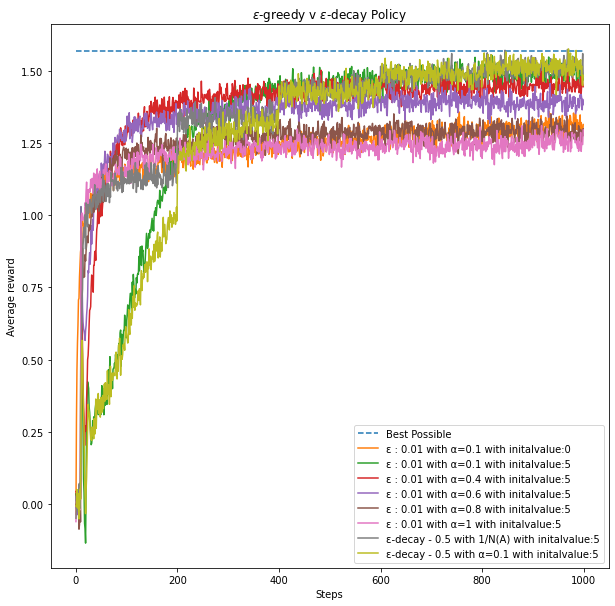

In [ ]:
plt.figure(figsize=(10, 10), facecolor='w', edgecolor='k')
plt.plot([av_best / runs for _ in range(time)], linestyle="--",label='Best Possible')
plt.plot(average_rewards[0], label='ε : 0.01 with α=0.1 with inital value:0')
plt.plot(average_rewards[1], label='ε : 0.01 with α=0.1 with inital value:5')
plt.plot(average_rewards[2], label='ε : 0.01 with α=0.4 with inital value:5')
plt.plot(average_rewards[3], label='ε : 0.01 with α=0.6 with inital value:5')
plt.plot(average_rewards[4], label='ε : 0.01 with α=0.8 with inital value:5')
plt.plot(average_rewards[5], label='ε : 0.01 with α=1 with inital value:5')
plt.plot(average_rewards[6], label='ε-decay - 0.5 with 1/N(A) with inital value:5')
plt.plot(average_rewards[7], label='ε-decay - 0.5 with α=0.1 with inital value:5')
plt.title("$\epsilon$-greedy v $\epsilon$-decay Policy with both")
plt.xlabel('Steps')
plt.ylabel('Average reward')
plt.legend()
plt.show() 

# Hyperparameter Testing


## Assumptions and Explanation

*Agent* in Stationary Environment

Hyperparamter testing for given RL problem to explore different situations in the epsilon greedy context and constraints to take a look at any inferences that can be made

Updates estimation using sample averages

Parameters:


*   Time
*   Epsilon
*   Arms





### Varying epsilon values and arm size (Time Constant)


In [ ]:
#Time=1000
# Hyperparameters
runs = 1000
time = 1000



epsilon1= [0,0.01, 0.05, 0.1,0.2, 0.5]
arms=[10,20,30,40,50,60,70,80,90]
df_check=pd.DataFrame()

for k in arms:
  bandits = [Bandit(k_arm=k,epsilon=eps, sample_averages=True) for eps in epsilon1] 
  best_action_counts, rewards, av_best = simulate(runs, time, bandits)
  rewards_arms=[rewards[0,-1],rewards[1,-1],rewards[2,-1],rewards[3,-1],rewards[4,-1],rewards[5,-1]]
  rewards_df=pd.DataFrame(rewards_arms)
  df_check=pd.concat([df_check,rewards_df], ignore_index=True,axis=1)

df_check.columns =arms

df_check.index=epsilon1
print("\n",df_check)




100%|██████████| 1000/1000 [00:28<00:00, 34.97it/s]


             10        20        30  ...        70        80        90
0.00  0.978644  1.092248  1.101655  ...  1.070147  1.115121  1.038221
0.01  1.344107  1.451916  1.493803  ...  1.458199  1.443653  1.644280
0.05  1.403434  1.685275  1.801406  ...  1.970671  1.925117  1.939446
0.10  1.346981  1.713659  1.772668  ...  1.972077  1.950653  1.921892
0.20  1.278141  1.390669  1.564138  ...  1.916849  1.818071  1.850607
0.50  0.747110  0.891919  0.998751  ...  1.207046  1.137792  1.198790

[6 rows x 9 columns]


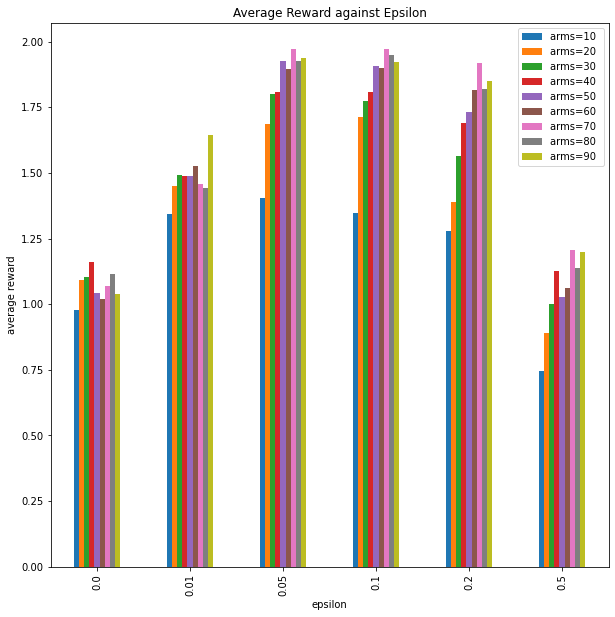

In [ ]:

# plt.figure()
a=df_check.plot( figsize=(10, 10),xlabel='epsilon',ylabel='average reward',title='Average Reward against Epsilon',kind='bar')
plt.legend(['arms=10 ','arms=20 ','arms=30 ','arms=40 ','arms=50 ','arms=60 ','arms=70 ','arms=80 ','arms=90 '],loc='best')



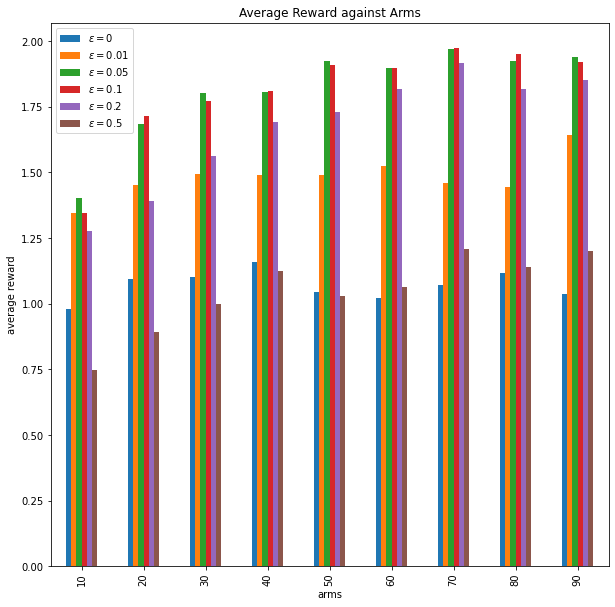

In [ ]:
df_check_t=df_check.transpose()
df_check_t.plot( figsize=(10, 10),xlabel='arms',ylabel='average reward',title='Average Reward against Arms',kind='bar')
plt.legend([r'$\epsilon=0$',r'$\epsilon=0.01$',r'$\epsilon=0.05$',r'$\epsilon=0.1$',r'$\epsilon=0.2$',r'$\epsilon=0.5$'],loc='best')


Varying epsilon values and time duration (Arms Constant)


In [ ]:
runs = 1000


epsilon1= [0,0.01, 0.05, 0.1,0.2, 0.5]
arms=10
time=[100,200,300,400,500,600,700,800,900,1000]
df_arms=pd.DataFrame()

for t in time:
  bandits = [Bandit(k_arm=arms,epsilon=eps, sample_averages=True) for eps in epsilon1] 
  best_action_counts, rewards, av_best = simulate(runs, t, bandits)
  rewards_arms=[rewards[0,-1],rewards[1,-1],rewards[2,-1],rewards[3,-1],rewards[4,-1],rewards[5,-1]]
  rewards_df=pd.DataFrame(rewards_arms)
  df_arms=pd.concat([df_arms,rewards_df], ignore_index=True,axis=1)

df_arms.columns =time

df_arms.index=epsilon1
print("\n",df_arms)


100%|██████████| 1000/1000 [00:28<00:00, 34.72it/s]


           100       200       300   ...      800       900       1000
0.00  1.088638  1.022726  0.997646  ...  1.050900  1.048030  0.994819
0.01  1.131344  1.111791  1.161525  ...  1.347847  1.274848  1.352879
0.05  1.089886  1.199596  1.285147  ...  1.446595  1.529324  1.378572
0.10  1.230581  1.258388  1.306203  ...  1.308202  1.378295  1.342736
0.20  1.102364  1.102840  1.204488  ...  1.173571  1.278886  1.235401
0.50  0.714177  0.749194  0.866690  ...  0.786214  0.731105  0.765776

[6 rows x 10 columns]


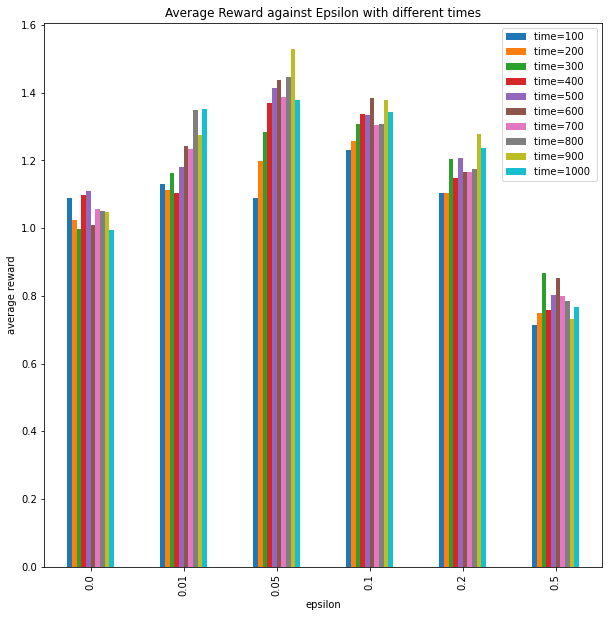

In [ ]:
df_arms.plot( figsize=(10, 10),xlabel='epsilon',ylabel='average reward',title='Average Reward against Epsilon with different times',kind='bar')
#Arms constant=10
plt.legend(['time=100 ','time=200 ','time=300 ','time=400 ','time=500 ','time=600 ','time=700 ','time=800 ','time=900 ','time=1000 '])




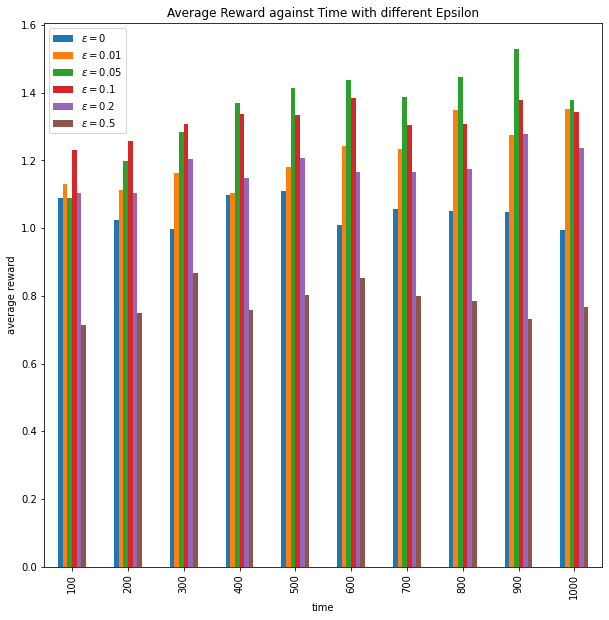

In [ ]:
df_arms_t=df_arms.transpose()
df_arms_t.plot( figsize=(10, 10),xlabel='time',ylabel='average reward',title='Average Reward against Time with different Epsilon',kind='bar',legend=True,label='Epsilon')
plt.legend([r'$\epsilon=0$',r'$\epsilon=0.01$',r'$\epsilon=0.05$',r'$\epsilon=0.1$',r'$\epsilon=0.2$',r'$\epsilon=0.5$'])


### Varying the number of arms and time duration (Epsilon Constant)


In [ ]:
runs = 1000

time=[100,200,300,400,500,600,700,800,900,1000]
epsilon1= 0.01
arms=[10,20,30,40,50,60,70,80,90]
df_epsilon=pd.DataFrame()

for t in time:
  bandits = [Bandit(k_arm=k,epsilon=epsilon1, sample_averages=True) for k in arms] 
  best_action_counts, rewards, av_best = simulate(runs, t, bandits)
  rewards_arms=[rewards[0,-1],rewards[1,-1],rewards[2,-1],rewards[3,-1],rewards[4,-1],rewards[5,-1],rewards[6,-1],rewards[7,-1],rewards[8,-1]]
  rewards_df=pd.DataFrame(rewards_arms)
  df_epsilon=pd.concat([df_epsilon,rewards_df], ignore_index=True,axis=1)

df_epsilon.columns =time

df_epsilon.index=arms
print("\n",df_epsilon)

100%|██████████| 1000/1000 [00:36<00:00, 27.28it/s]


         100       200       300   ...      800       900       1000
10  1.104022  1.035631  1.202356  ...  1.319074  1.279050  1.266718
20  1.151861  1.163350  1.183742  ...  1.398730  1.392964  1.472885
30  1.106342  1.142102  1.248613  ...  1.408881  1.504607  1.487694
40  1.059808  1.125569  1.273916  ...  1.457621  1.519359  1.455669
50  1.099264  1.169340  1.237908  ...  1.434961  1.471614  1.488722
60  1.077188  1.178885  1.209497  ...  1.473835  1.530426  1.481317
70  1.136017  1.231037  1.267510  ...  1.401154  1.502793  1.473543
80  1.123573  1.204714  1.214423  ...  1.463497  1.545762  1.571475
90  1.136453  1.264815  1.247482  ...  1.509272  1.475977  1.479696

[9 rows x 10 columns]


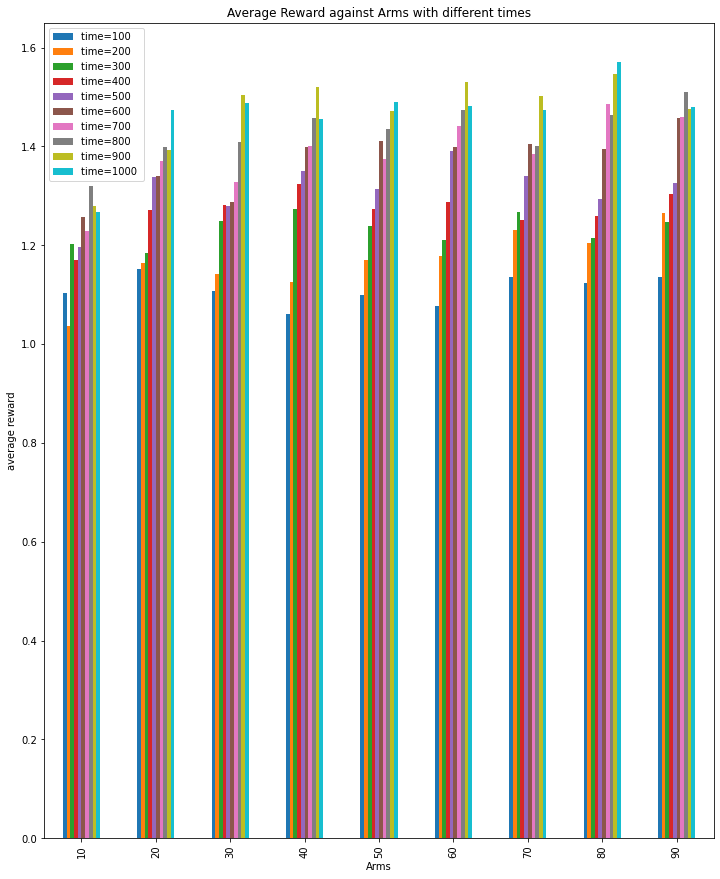

In [ ]:
df_epsilon.plot( figsize=(12, 15),xlabel='Arms',ylabel='average reward',title='Average Reward against Arms with different times',kind='bar')
#Epsilon Constant=0.01
plt.legend(['time=100 ','time=200 ','time=300 ','time=400 ','time=500 ','time=600 ','time=700 ','time=800 ','time=900 ','time=1000 '],loc='best')


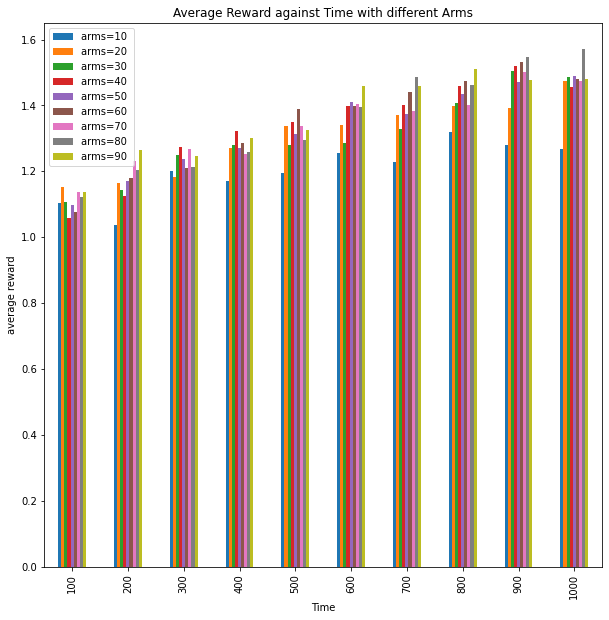

In [ ]:

df_epsilon_t=df_epsilon.transpose()
df_epsilon_t.plot( figsize=(10, 10),xlabel='Time',ylabel='average reward',title='Average Reward against Time with different Arms',kind='bar')
plt.legend(['arms=10 ','arms=20 ','arms=30 ','arms=40 ','arms=50 ','arms=60 ','arms=70 ','arms=80 ','arms=90 '],loc='best')